# `find_and_suppress` on MIDOG++ — first single-pass run

**The question.** MIDOG++ annotates every mitotic figure inside a ~2 mm² ROI. So we can
hand the algorithm *one* of those annotations, let it search the rest of the ROI, and score
every detection against the ground truth we held back. How far does one human click get you?

**Scope of this run.** One image per tumour domain (7), one randomly-chosen mitotic-figure
seed each, a single forward pass. No iterative bootstrapping, no multi-seed variance
estimate, no hematoxylin variant — those are implemented but not run here.

All logic lives in [`midog_utils/`](midog_utils/); this notebook only calls it.

**Environment.** `requirements-midog-utils.txt`, *not* `requirements.txt` — nothing here
imports fastai or SlideRunner. The pin that matters is `numpy < 2`: the opencv wheel in use
was built against the numpy 1.x C API, so under numpy 2.x both `import cv2` and `tifffile`'s
LZW path (needed for the pyramidal 505/506) fail.

In [1]:
import sys, time
sys.path.insert(0, '..') if 'midog_utils' not in __import__('os').listdir('.') else None

import numpy as np, pandas as pd, matplotlib.pyplot as plt

from midog_utils import dataset as ds, channels as ch, template_match as tm
from midog_utils import find_and_suppress as fs, evaluate as ev, experiment as ex, viz

pd.set_option('display.width', 200); pd.set_option('display.max_columns', 60)

images, annotations = ds.load_annotations('databases/MIDOG++.json')
ds.check_invariants(annotations)          # every bbox is 50x50 and TLBR, or this raises
print(f'{len(images)} annotated images, {len(annotations)} annotations')
print(annotations.category_id.map(ds.CATEGORY_NAMES).value_counts().to_string())

503 annotated images, 26286 annotations
category_id
not mitotic figure    14349
mitotic figure        11937


## The coordinate gate

Multiscale + rotation means a response-map peak has to be mapped back to image coordinates
using **half of its own template's size** — a 31 px template yields an `(H-30, W-30)` map and
a 51 px template an `(H-50, W-50)` map, and each has to be shifted before the maps are fused.

Getting this wrong shifts every detection by 10–25 px, which at a ~33 px match radius destroys
recall and presents as *"template matching doesn't work on H&E"* rather than as a bug. So each
augmentation is planted into a noise canvas at a known centre and the peak of the **fused** map
has to come back within 1 px. Nothing runs on a real image until this passes.

In [2]:
rng = np.random.default_rng(0)
yy, xx = np.mgrid[-36:37, -36:37]
probe = (200*np.exp(-((xx/9.0)**2 + (yy/22.0)**2)) + rng.normal(0, 4, (73, 73))).astype(np.float32)

templates, metas = tm.build_augmentations(probe, scales=(0.6, 0.8, 1.0), n_angles=12, flips=(False, True))
recovered = tm.plant_and_recover(templates, metas, canvas=257, tolerance=1.0)

offsets = np.array([(dx, dy) for _, dx, dy, _ in recovered])
print(f'{len(templates)} augmentations, sizes {sorted({t.shape[0] for t in templates})}')
print(f'GATE PASSED: max |dx| = {abs(offsets[:,0]).max()} px, max |dy| = {abs(offsets[:,1]).max()} px')

72 augmentations, sizes [31, 41, 51]
GATE PASSED: max |dx| = 0 px, max |dy| = 0 px


## Which images

One ROI per tumour domain: the downloaded image with the most mitotic figures, ties to the
lower id. Maximising category-1 count matters at this sample size — with one seed held out,
an image with 4 mitotic figures leaves an evaluation set of 3.

The rule also drops `001.tiff` on its own: it has **zero** category-1 annotations (4 look-alikes
only), so it cannot be seeded with a mitotic figure at all.

In [3]:
selection = ex.select_domain_images(images, annotations)
counts = (annotations.groupby(['file_name', 'category_id']).size().unstack(fill_value=0)
            .rename(columns=ds.CATEGORY_NAMES))
selection.merge(counts, left_on='file_name', right_index=True)

,image_id,file_name,width,height,tumor_type,n_mitotic,mitotic figure,not mitotic figure
0,301,301.tiff,6447,4835,canine cutaneous mast cell tumor,218,218,109
1,201,201.tiff,6577,4933,canine lung cancer,18,18,49
2,246,246.tiff,6577,4933,canine lymphosarcoma,116,116,123
3,405,405.tiff,6577,4933,canine soft tissue sarcoma,14,14,19
4,2,002.tiff,7215,5412,human breast cancer,9,9,7
5,506,506.tiff,7215,5412,human melanoma,12,12,12
6,350,350.tiff,7215,5412,human neuroendocrine tumor,4,4,16


## Configuration

Departures from `bbox tuning code reference/bbox_tuning.py` that change results rather than style:

| | reference | here | why |
|---|---|---|---|
| rotations | dead — `shortlist_augmentations` overwrites the rotated template with the unrotated one, so all rotations collapse to one | 12 real angles × 2 flips | mitotic figures have no canonical orientation |
| scales | `0.5 … 2.0` | **single scale, 51 px** | multi-scale fusion was measured and rejected — the comparison is run below, in *Which fusion the default rests on* |
| NMS ordering | by `x top left`; the match score is computed then dropped | score-ordered | otherwise the survivor of a cluster is just the right-most one, and there is no score left to rank or threshold with |
| NMS radius | fixed pixel value | **the image's own match radius** (29.6–33.1 px, from µm/px) | a constant 25 px is *below* the radius at which a hit is credited, so two detections 26 px apart both survived while both sat inside one object — one scored as a true positive, the other as a false positive on the same object |
| existing annotations | blacked out before correlating | untouched; the seed's own hit dropped afterwards | black holes give `TM_CCOEFF_NORMED` zero-variance windows and hard edges to correlate against |
| refine / stability / AR / PSNR filters | on | off | evaluation is point-based, and the stability check passes 0/9 objects on H&E (see the bbox-tuning research log) |

**Why a single 51 px template rather than a scale pyramid.** `TM_CCOEFF_NORMED` is a
correlation over the template's pixels, so a *smaller* template has a wider null distribution
and produces a higher maximum by chance. Taking a raw element-wise max across 31 / 41 / 51 px
therefore hands the win to the smallest template regardless of what is actually in the image.

That is a claim about the fusion rule, and it is measured rather than asserted — the
comparison is in **Which fusion the default rests on**, below, once the response-map
machinery is in scope. The short version: the single 51 px template wins on both images
tested, but the margin over z-normalised multi-scale fusion is small on one of them, and the
two candidate criteria for "wins" do not agree on both images.

Multi-scale remains available through `FSConfig(scales=..., scale_normalize=...)`.

In [4]:
cfg = fs.FSConfig()
print(cfg)
print(f'\n{cfg.n_augmentations} augmentations per run '
      f'({cfg.n_angles} rotations x {len(cfg.flips)} flips x {len(cfg.scales)} scale)')

FSConfig(channel='gray_inverted', base_size=51, patch_size=73, scales=(1.0,), n_angles=12, flips=(False, True), peak_min_distance=7, score_threshold=0.25, max_peaks=250000, nms_radius=None, self_hit_radius=5.0, max_detections=1000000000, scale_normalize=False)

24 augmentations per run (12 rotations x 2 flips x 1 scale)


## Run

24 augmentations (12 rotations × 2 flips × 1 scale) correlated over a ~35-megapixel ROI,
plus the nucleus-blob baseline. The correlation itself is 26–47 s per image; end to end with
baselines it is 32–59 s, about 5 minutes for all seven. An earlier note here said "~100 s for
the 72 correlations", which was left over from the multi-scale config that was rejected.

In [5]:
t0 = time.time()
results, metrics, detections = ex.run_experiment(selection, annotations, cfg=cfg, seed=0)
print(f'\ntotal {time.time()-t0:.0f}s')

metrics.to_csv('results/fs_metrics.csv', index=False)
detections.to_csv('results/fs_detections.csv', index=False)

=== 301.tiff  (canine cutaneous mast cell tumor, 218 mitotic) 
    recall@K=0.097  attraction@K=0.046  coverage=0.95  (36s)
=== 201.tiff  (canine lung cancer, 18 mitotic) 
    recall@K=0.000  attraction@K=0.000  coverage=0.93  (39s)
=== 246.tiff  (canine lymphosarcoma, 116 mitotic) 
    recall@K=0.043  attraction@K=0.008  coverage=0.95  (39s)
=== 405.tiff  (canine soft tissue sarcoma, 14 mitotic) 
    recall@K=0.000  attraction@K=0.000  coverage=0.88  (32s)
=== 002.tiff  (human breast cancer, 9 mitotic) 
    recall@K=0.125  attraction@K=0.000  coverage=0.95  (43s)
=== 506.tiff  (human melanoma, 12 mitotic) 
    recall@K=0.000  attraction@K=0.000  coverage=0.91  (46s)
=== 350.tiff  (human neuroendocrine tumor, 4 mitotic) 
    recall@K=0.000  attraction@K=0.000  coverage=0.91  (59s)

total 295s


## Results

### Headline: `recall@K`

`K` = the number of mitotic figures in that ROI, minus the seed. *"Given a detection budget
equal to the true mitosis count, how many does one template find?"*

It is threshold-free on purpose. The number of `TM_CCOEFF_NORMED` peaks above any fixed score
differs by orders of magnitude between a dense domain like lymphosarcoma and a sparse one like
melanoma, so precision at a fixed threshold is not comparable across the table.

In [6]:
ex.summary_table(metrics)

,tumor_type,file_name,method,n_gt_mitotic_eval,n_lookalike_gt,recall_at_k,lookalike_attraction_at_k,topk_tp,topk_fp_lookalike,topk_fp_unannotated,sens@8fp_mm2,sens@64fp_mm2,n_unanimous,recall_unanimous_at_k,n_contested,recall_contested_at_k,max_detection_score,n_detections_total
0,canine cutaneous mast cell tumor,301.tiff,find_and_suppress,217,109,0.096774,0.045872,21,5,191,0.013825,0.059908,163,0.104294,54,0.074074,0.715010,16681
1,canine lung cancer,201.tiff,find_and_suppress,17,49,0.000000,0.000000,0,0,17,0.000000,0.000000,6,0.000000,11,0.000000,0.727572,15349
2,canine lymphosarcoma,246.tiff,find_and_suppress,115,123,0.043478,0.008130,5,1,109,0.000000,0.060870,99,0.030303,16,0.125000,0.612662,17443
3,canine soft tissue sarcoma,405.tiff,find_and_suppress,13,19,0.000000,0.000000,0,0,13,0.000000,0.000000,9,0.000000,4,0.000000,0.891524,13658
4,human breast cancer,002.tiff,find_and_suppress,8,7,0.125000,0.000000,1,0,7,0.125000,0.500000,7,0.142857,1,0.000000,0.749510,17118
5,human melanoma,506.tiff,find_and_suppress,11,12,0.000000,0.000000,0,0,11,0.000000,0.000000,8,0.000000,3,0.000000,0.894710,15829
6,human neuroendocrine tumor,350.tiff,find_and_suppress,3,16,0.000000,0.000000,0,0,3,0.000000,0.333333,0,NaN,3,0.000000,0.780752,15145


## Every detection, not just the top K

`recall@K` deliberately imposes a budget. This drops it: **every** detection the search
returned — every local maximum above the score floor that survived NMS — bucketed by what it
landed on.

**Read `coverage_frac` first.** It is the fraction of the ROI lying within a match radius of
*some* detection, and it runs 0.88–0.95 here. "Was this annotation found?" is scored as "is
there a detection within the match radius of it?", so at that coverage a full-list recall near
1.0 is mostly a statement about how densely the list tiles the ROI. The floor is in the table
above: `random_in_tissue` — uniform noise, no image content used — reaches full-list mitotic
recall of 0.46–1.00 at coverage 0.69–0.78.

This is a property of the 0.25 score floor, not of the method. The sweep two sections down
shows 301.tiff going 16 681 → 7 277 → 404 detections at thresholds 0.25 → 0.50 → 0.60; at 404
detections coverage is a few percent and these numbers mean something again. The same sweep
shows how arbitrary a fixed floor is across images: at 0.60 there are 6 detections on 246.tiff
and 6 479 on 405.tiff.

In [7]:
cmp = metrics[metrics.method == 'find_and_suppress'][
    ['tumor_type', 'file_name', 'n_gt_mitotic_eval', 'n_lookalike_gt',
     'recall_at_k', 'lookalike_attraction_at_k', 'coverage_frac']
].sort_values('tumor_type').reset_index(drop=True)
cmp['ratio_recall_over_attraction'] = (cmp.recall_at_k / cmp.lookalike_attraction_at_k.replace(0, np.nan)).round(2)
cmp

,tumor_type,file_name,n_gt_mitotic_eval,n_lookalike_gt,recall_at_k,lookalike_attraction_at_k,coverage_frac,ratio_recall_over_attraction
0,canine cutaneous mast cell tumor,301.tiff,217,109,0.096774,0.045872,0.9452,2.11
1,canine lung cancer,201.tiff,17,49,0.000000,0.000000,0.9272,NaN
2,canine lymphosarcoma,246.tiff,115,123,0.043478,0.008130,0.9483,5.35
3,canine soft tissue sarcoma,405.tiff,13,19,0.000000,0.000000,0.8764,NaN
4,human breast cancer,002.tiff,8,7,0.125000,0.000000,0.9481,NaN
5,human melanoma,506.tiff,11,12,0.000000,0.000000,0.9067,NaN
6,human neuroendocrine tumor,350.tiff,3,16,0.000000,0.000000,0.9087,NaN


### Against the baselines

`nucleus_blobs` is the *"any dark blob"* comparator: hematoxylin channel → tiled Otsu →
connected components → area filter → centroids, ranked by mean chromatin intensity.
`random_in_tissue` is the floor — random points restricted to tissue, because uniform points
over the ROI would land in white space and make any lift look impressive.

If one-shot template matching does not beat the blob detector, that is the finding.

In [8]:
pivot = metrics.pivot_table(index=['tumor_type', 'file_name'], columns='method',
                            values='recall_at_k').round(3)
pivot['lift_vs_blobs'] = (pivot['find_and_suppress'] /
                          pivot['nucleus_blobs'].replace(0, np.nan)).round(2)
pivot

,method,find_and_suppress,nucleus_blobs,random_in_tissue,lift_vs_blobs
tumor_type,file_name,,,,
canine cutaneous mast cell tumor,301.tiff,0.097,0.599,0.018,0.16
canine lung cancer,201.tiff,0.000,0.235,0.000,0.00
canine lymphosarcoma,246.tiff,0.043,0.330,0.009,0.13
canine soft tissue sarcoma,405.tiff,0.000,0.000,0.000,NaN
human breast cancer,002.tiff,0.125,0.000,0.000,NaN
human melanoma,506.tiff,0.000,0.000,0.000,NaN
human neuroendocrine tumor,350.tiff,0.000,0.000,0.000,NaN


The `recall@K` table above is already an equal-budget comparison. This second one is at a
much looser budget: full lists for the matcher, and the blob detector truncated to the same
number of candidates the matcher produced.

`budget_delivered` records what the blob detector could actually supply. If it is below
`matcher_budget` the comparison is not equal-budget on that row — the blob detector simply
ran out of connected components. (It used to be capped at 20 000 regardless, which made the
two densest ROIs silently unequal; that cap is gone.)

In [9]:
budget = metrics[metrics.method == 'nucleus_blobs'][
    ['file_name', 'matcher_budget', 'budget_delivered', 'mitotic_recall_at_matcher_budget']].set_index('file_name')
matcher = metrics[metrics.method == 'find_and_suppress'][
    ['tumor_type', 'file_name', 'mitotic_recall']].set_index('file_name')
eq = matcher.join(budget).rename(columns={
    'mitotic_recall': 'find_and_suppress',
    'mitotic_recall_at_matcher_budget': 'nucleus_blobs'})
eq[['find_and_suppress', 'nucleus_blobs']] = eq[['find_and_suppress', 'nucleus_blobs']].round(3)
eq.sort_values('tumor_type')

,tumor_type,find_and_suppress,matcher_budget,budget_delivered,nucleus_blobs
file_name,,,,,
301.tiff,canine cutaneous mast cell tumor,0.995,16681.0,16681.0,1.000
201.tiff,canine lung cancer,0.941,15349.0,12446.0,0.882
246.tiff,canine lymphosarcoma,0.991,17443.0,17443.0,0.957
405.tiff,canine soft tissue sarcoma,1.000,13658.0,7577.0,1.000
002.tiff,human breast cancer,1.000,17118.0,8814.0,0.875
506.tiff,human melanoma,1.000,15829.0,8754.0,0.818
350.tiff,human neuroendocrine tumor,1.000,15145.0,8173.0,1.000


In [10]:
full = metrics.pivot_table(index=['tumor_type', 'file_name'], columns='method',
                           values='mitotic_recall').round(3)
full.columns = [f'{c}_full_list' for c in full.columns]
n_det = metrics.pivot_table(index=['tumor_type', 'file_name'], columns='method',
                            values='n_detections_total')
n_det.columns = [f'n_{c}' for c in n_det.columns]
cov = metrics.pivot_table(index=['tumor_type', 'file_name'], columns='method',
                          values='coverage_frac').round(3)
cov.columns = [f'coverage_{c}' for c in cov.columns]
full.join(n_det).join(cov[['coverage_find_and_suppress']])

,,find_and_suppress_full_list,nucleus_blobs_full_list,random_in_tissue_full_list,n_find_and_suppress,n_nucleus_blobs,n_random_in_tissue,coverage_find_and_suppress
tumor_type,file_name,,,,,,,
canine cutaneous mast cell tumor,301.tiff,0.995,1.000,0.802,16681.0,20370.0,16681.0,0.945
canine lung cancer,201.tiff,0.941,0.882,0.588,15349.0,12446.0,15349.0,0.927
canine lymphosarcoma,246.tiff,0.991,0.965,0.861,17443.0,21059.0,17443.0,0.948
canine soft tissue sarcoma,405.tiff,1.000,1.000,0.462,13658.0,7577.0,13658.0,0.876
human breast cancer,002.tiff,1.000,0.875,0.625,17118.0,8814.0,17118.0,0.948
human melanoma,506.tiff,1.000,0.818,0.909,15829.0,8754.0,15829.0,0.907
human neuroendocrine tumor,350.tiff,1.000,1.000,1.000,15145.0,8173.0,15145.0,0.909


## Every detection, not just the top K

`recall@K` deliberately imposes a budget. This drops it: **every** detection the search
returned — every local maximum above the score floor that survived NMS — bucketed by what it
landed on.

**Read `coverage_frac` first.** It is the fraction of the ROI lying within a match radius of
*some* detection. "Was this annotation found?" is scored as "is there a detection within the
match radius of it?", so when `coverage_frac` is 0.9-plus, a full-list recall of 1.000 is a
statement about how densely the list tiles the ROI, not about the detector. The control is
right there in the table above: `random_in_tissue` — uniform noise — also reaches full-list
mitotic recall near 1.0 on several ROIs.

This is a property of the 0.25 score floor, not of the method. The sweep two sections down
shows 301.tiff going 20 031 → 7 538 → ~400 detections at thresholds 0.25 → 0.50 → 0.60; at
~400 detections coverage is a few percent and these numbers mean something again.

In [11]:
ex.full_list_table(metrics)

,tumor_type,file_name,all_n_detections,coverage_frac,all_tp,all_fp_lookalike,all_fp_unannotated,all_matched_any_gt,all_matched_frac,all_precision_mitotic,all_mitotic_gt_found,all_mitotic_gt_missed,all_lookalike_gt_found,all_lookalike_gt_missed
0,canine cutaneous mast cell tumor,301.tiff,16681,0.9452,216,102,16363,318,0.019064,0.012949,216,1,102,7
1,canine lung cancer,201.tiff,15349,0.9272,16,46,15287,62,0.004039,0.001042,16,1,46,3
2,canine lymphosarcoma,246.tiff,17443,0.9483,114,119,17210,233,0.013358,0.006536,114,1,119,4
3,canine soft tissue sarcoma,405.tiff,13658,0.8764,13,19,13626,32,0.002343,0.000952,13,0,19,0
4,human breast cancer,002.tiff,17118,0.9481,8,7,17103,15,0.000876,0.000467,8,0,7,0
5,human melanoma,506.tiff,15829,0.9067,11,11,15807,22,0.001390,0.000695,11,0,11,1
6,human neuroendocrine tumor,350.tiff,15145,0.9087,3,16,15126,19,0.001255,0.000198,3,0,16,0


`all_matched_frac` is the fraction of detections that landed on *any* annotation, mitotic
or look-alike. `all_precision_mitotic` counts only mitotic hits. Neither is "the cost of the
method at its natural operating point" — there is no natural operating point here, only
`FSConfig.score_threshold`, and what that floor means varies by orders of magnitude between
images.

`all_mitotic_gt_missed` is the column that would carry information if coverage were not
saturated. Compare it against `coverage_frac` before reading anything into it.

### Where the score floor sits

"Everything that was found" is only meaningful relative to the score threshold the search ran
at (0.25 here). This makes that dependence explicit rather than leaving it buried in a config
value.

In [12]:
sweeps = []
for fn, res in results.items():
    sw = ev.threshold_sweep(res['detections'], res['gt_eval'])
    sw.insert(0, 'file_name', fn)
    sweeps.append(sw)
sweeps = pd.concat(sweeps, ignore_index=True)
sweeps.to_csv('results/fs_threshold_sweep.csv', index=False)
sweeps

,file_name,score_threshold,n_detections,tp,fp_lookalike,fp_unannotated,precision,recall,f1
0,301.tiff,0.25,16681,216,102,16363,0.0129,0.9954,0.0256
1,301.tiff,0.40,14708,211,100,14397,0.0143,0.9724,0.0283
2,301.tiff,0.50,7277,176,77,7024,0.0242,0.8111,0.0470
3,301.tiff,0.60,404,30,7,367,0.0743,0.1382,0.0966
4,301.tiff,0.70,1,0,0,1,0.0000,0.0000,0.0000
5,301.tiff,0.80,0,0,0,0,0.0000,0.0000,0.0000
6,301.tiff,0.90,0,0,0,0,0.0000,0.0000,0.0000
7,201.tiff,0.25,15349,16,46,15287,0.0010,0.9412,0.0021
8,201.tiff,0.40,12733,15,46,12672,0.0012,0.8824,0.0024
9,201.tiff,0.50,7653,14,41,7598,0.0018,0.8235,0.0037


## Why so few true positives

Detection metrics conflate two separate questions: whether the response map carries any signal
at all, and whether the ranking can surface that signal against the base rate. This reads the
map directly at annotated locations to separate them.

`auc_mitosis_vs_nucleus` is P(a random mitotic figure outscores a random **ordinary** nucleus),
with ties split. "Ordinary" is enforced — every blob centroid within a match radius of any
annotation is removed from the reference population, so the mitotic figures are not silently
competing against themselves. 0.5 = no signal.

`mean_mitosis_rank` = `(1 − AUC) × n_nuclei` and `median_mitosis_rank` say where a mitotic
figure lands in a ranking of every ordinary nucleus in the ROI — compare them against `K`.
The two are reported separately because they differ substantially, and the earlier version of
this notebook printed the *mean* under the name `median_mitosis_rank`.

In [13]:
probe_files = ['002.tiff', '246.tiff']
probe_seeds = [int(metrics.loc[(metrics.file_name == fn) &
                               (metrics.method == 'find_and_suppress'), 'seed_ann_id'].iloc[0])
               for fn in probe_files]

probe = pd.DataFrame([ex.score_probe(fn, annotations, sid, cfg=cfg)
                      for fn, sid in zip(probe_files, probe_seeds)])
probe.to_csv('results/fs_score_probe.csv', index=False)
probe.T

,0,1
file_name,002.tiff,246.tiff
n_mitotic,8,115
n_nuclei_all_blobs,8814,21059
n_nuclei,8796,20609
mitotic_base_rate_pct,0.091,0.546
seed_self_score,1.0,1.0
median_score_mitotic,0.6036,0.4511
median_score_lookalike,0.5372,0.4113
median_score_nucleus,0.4143,0.3121
median_score_random,0.3393,0.2767


Three things to read off:

1. **The map has signal.** Mitotic figures score above ordinary nuclei, which score above
   random tissue. AUC is well clear of 0.5 (0.953 and 0.879).
2. **The signal is not mitosis-specific.** `auc_lookalike_vs_nucleus` sits close behind
   (0.863 and 0.799) — correlating against a chromatin template measures *"dark, compact,
   similar texture"*, which is exactly what makes a look-alike a look-alike. The gap
   (`discrimination`, 0.08–0.09) is the whole of what separates the two tasks.
3. **The base rate is the killer.** Mitotic figures are 0.09% and 0.55% of the nuclei in
   these two ROIs. `median_mitosis_rank` versus `K` shows the shortfall directly: on 002.tiff
   the typical mitotic figure ranks 85th among ordinary nuclei against a budget of K=8, and on
   246.tiff 1103rd against K=115.

One claim from the earlier version of this notebook does **not** survive the corrected
nucleus population. It read *"the top 0.1% of ordinary nuclei outscore 90% of mitotic
figures"*, from `p99.9_nucleus > p90_mitotic`. Once blob centroids sitting on annotations are
excluded from the nucleus set — previously the mitotic figures and look-alikes were competing
against themselves — that inequality holds on 246.tiff (0.556 vs 0.517) but reverses on
002.tiff (0.651 vs 0.664). The base-rate problem is real; that particular way of stating it
was an artefact of the contamination.

### Which fusion the default rests on

`FSConfig.scales = (1.0,)` — one 51 px template — is a measured choice, and this is the
measurement. Same two images, same seeds, same nucleus population as the probe above; only the
fusion rule changes. Four variants: raw element-wise max over 31/41/51 px, the same fused on a
robust z-scale first, and each single scale on its own.

Slow (~192 correlations per image against 24 for the main run), so it is scoped to two images.

In [14]:
fusion = ex.fusion_variants(probe_files, annotations, probe_seeds, cfg=cfg)
fusion.to_csv('results/fs_fusion_variants.csv', index=False)
fusion[['file_name', 'variant', 'n_templates', 'n_nuclei',
        'auc_mitosis_vs_nucleus', 'auc_lookalike_vs_nucleus', 'discrimination',
        'mean_mitosis_rank', 'median_mitosis_rank', 'K']]

,file_name,variant,n_templates,n_nuclei,auc_mitosis_vs_nucleus,auc_lookalike_vs_nucleus,discrimination,mean_mitosis_rank,median_mitosis_rank,K
0,002.tiff,fused_max_multiscale,72,8796,0.895,0.810,0.084,926,334,8
1,002.tiff,fused_z_normalised,72,8796,0.942,0.841,0.101,512,87,8
2,002.tiff,scale_1.0_only,24,8796,0.953,0.863,0.089,418,85,8
3,002.tiff,scale_0.6_only,24,8796,0.734,0.667,0.067,2336,2297,8
4,246.tiff,fused_max_multiscale,72,20609,0.812,0.799,0.013,3871,3472,115
5,246.tiff,fused_z_normalised,72,20609,0.877,0.816,0.061,2539,1656,115
6,246.tiff,scale_1.0_only,24,20609,0.879,0.799,0.080,2496,1103,115
7,246.tiff,scale_0.6_only,24,20609,0.702,0.763,-0.061,6142,5661,115


What this table does and does not settle.

- **The small-template bias is real.** `scale_0.6_only` is worst on both images (AUC 0.734 /
  0.702), and the raw multi-scale max inherits most of that deficit (0.895 / 0.812) even
  though it has the 51 px template available to it — because a 31 px template's wider null
  wins the element-wise maximum by chance. That is the mechanism, confirmed.
- **z-normalising before fusing recovers nearly all of it**, exactly as the mechanism
  predicts: 0.895 → 0.942 on 002.tiff and 0.812 → 0.877 on 246.tiff.
- **The single 51 px template still wins**, on AUC and on median rank, on both images
  (0.953 / 0.879, ranks 85 / 1103). The margin over `fused_z_normalised` on 246.tiff is
  0.002 in AUC, so "wins" there rests on the rank, not the AUC.
- **The criteria do not agree.** The default was chosen on `auc_mitosis_vs_nucleus`, but
  point 2 above — the claim the experiment turns on — is about `discrimination`. On 246.tiff
  both criteria pick `scale_1.0_only`; on 002.tiff `discrimination` prefers
  `fused_z_normalised` (0.101 vs 0.089).
- **What it does not settle: which variant is best in general.** Two images, one seed each.
  The single 51 px template is kept as the default because it wins the primary criterion on
  both, is the annotation box itself, and costs a third of the compute — not because two ROIs
  have closed the question.

*(These numbers differ from the ones this comparison produced before the evaluation fixes.
The earlier table scored against a nucleus population that was capped at 20 000 blobs and
still contained the annotated mitoses and look-alikes, and computed AUC with ties counted as
losses. Under that population `fused_z_normalised` appeared to beat `scale_1.0_only` on
246.tiff; it does not once the population is correct.)*

### FROC

Sensitivity against false positives per mm². Both false-positive buckets count against the
mitosis task here — a look-alike hit is still a wrong answer, the bucket split just says *what
kind* of wrong. ROIs are ~2 mm², so this axis is directly comparable to the MIDOG literature.

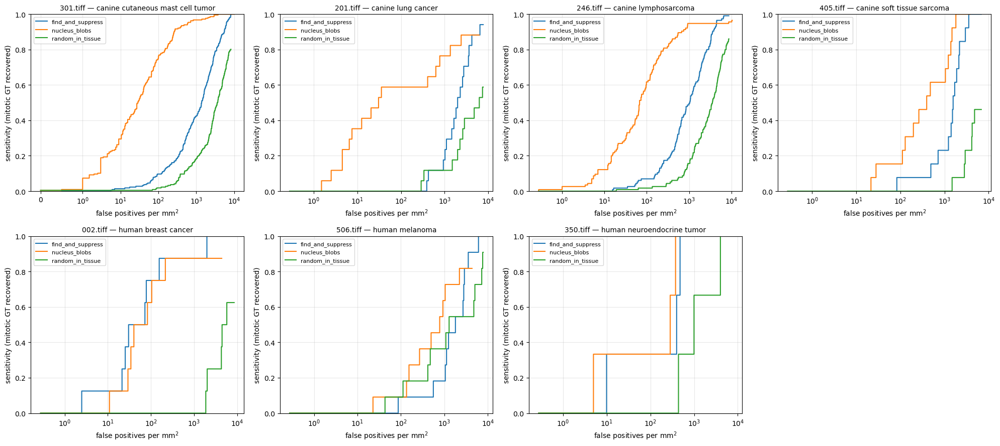

In [15]:
fig, axes = plt.subplots(2, 4, figsize=(20, 9))
for ax, (fn, res) in zip(axes.ravel(), results.items()):
    curves = [('find_and_suppress', *res['curve'])]
    if 'baseline_blobs_curve' in res:
        curves.append(('nucleus_blobs', *res['baseline_blobs_curve']))
        curves.append(('random_in_tissue', *res['baseline_random_curve']))
    tumor = selection.loc[selection.file_name == fn, 'tumor_type'].iloc[0]
    viz.froc_plot(curves, ax=ax, title=f'{fn} — {tumor}')
for ax in axes.ravel()[len(results):]:
    ax.axis('off')
fig.tight_layout(); plt.show()

### Where the detections land

White star = the seed. Red = ground-truth mitotic figures, yellow = ground-truth look-alikes.
Detections are the top-K only, coloured by bucket, and drawn at the **match radius** — so a
circle touching a ground-truth box is what the scorer counts as a hit.

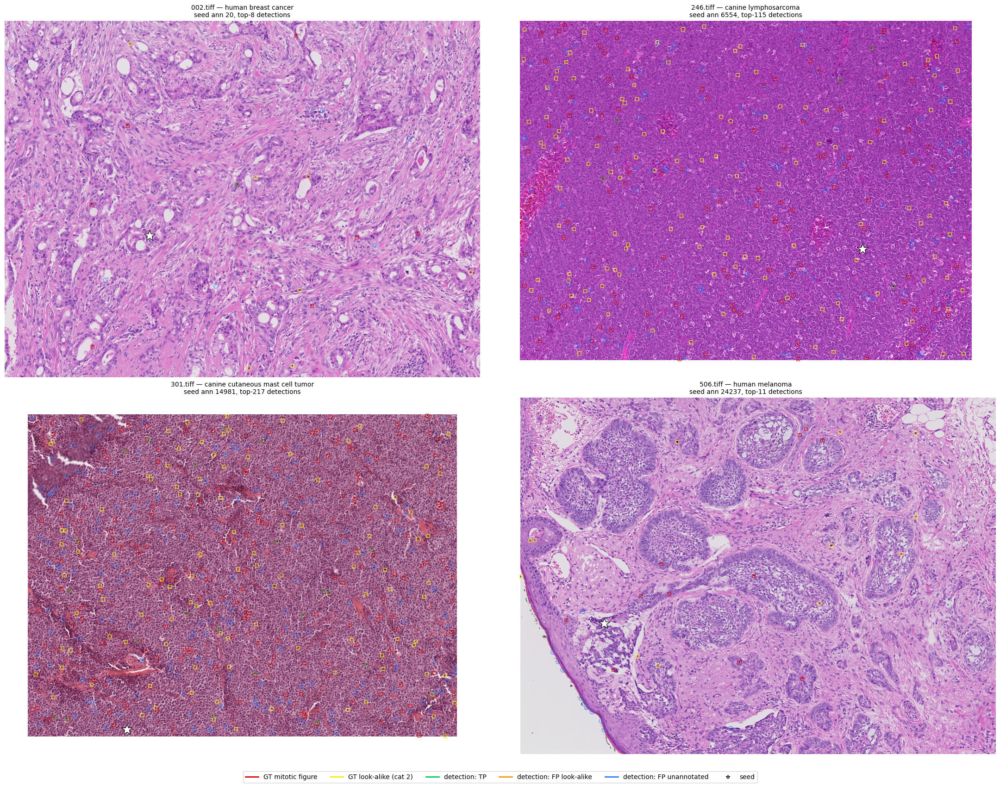

In [16]:
show = ['002.tiff', '246.tiff', '301.tiff', '506.tiff']
fig, axes = plt.subplots(2, 2, figsize=(22, 17))
for ax, fn in zip(axes.ravel(), show):
    res = results[fn]                       # detections are already computed; only the pixels are reloaded
    rgb = ds.load_roi(f'images/{fn}')
    k = res['metrics'][0]['k']
    tumor = selection.loc[selection.file_name == fn, 'tumor_type'].iloc[0]
    viz.overlay(rgb, res['gt'], res['detections'], (res['seed'].cx, res['seed'].cy),
                ax=ax, downsample=4, top_n=k, radius=res['radius'],
                title=f"{fn} — {tumor}\nseed ann {int(res['seed'].ann_id)}, top-{k} detections")
    del rgb
fig.legend(handles=viz.legend_handles(), loc='lower center', ncol=6, fontsize=10)
fig.tight_layout(rect=(0, 0.03, 1, 1)); plt.show()

### Expert-agreement split

MIDOG++ keeps the per-rater votes in `labels`, so mitotic recall splits for free into
annotations every expert agreed on versus ones they argued about. It separates *"missed an
obvious mitosis"* from *"missed a borderline call"*.

Budgeted at the same K as everything else. Without a budget this table reads 1.0 in every
cell — the full detection list covers the whole ROI, so both halves of the split are found by
construction and the comparison says nothing.

One caveat on what `unanimous` means: for category 1 the dataset holds only two label
multisets, `(1,1)` ×8917 and `(1,1,2)` ×3020. So `unanimous` is exactly equivalent to
`n_votes == 2` — it is a clean proxy for *"did this need a third reader"*, not a signal
independent of the vote count.

In [17]:
metrics[metrics.method == 'find_and_suppress'][
    ['tumor_type', 'file_name', 'k',
     'n_unanimous', 'recall_unanimous_at_k', 'n_contested', 'recall_contested_at_k']
].sort_values('tumor_type').reset_index(drop=True)

,tumor_type,file_name,k,n_unanimous,recall_unanimous_at_k,n_contested,recall_contested_at_k
0,canine cutaneous mast cell tumor,301.tiff,217,163,0.104294,54,0.074074
1,canine lung cancer,201.tiff,17,6,0.000000,11,0.000000
2,canine lymphosarcoma,246.tiff,115,99,0.030303,16,0.125000
3,canine soft tissue sarcoma,405.tiff,13,9,0.000000,4,0.000000
4,human breast cancer,002.tiff,8,7,0.142857,1,0.000000
5,human melanoma,506.tiff,11,8,0.000000,3,0.000000
6,human neuroendocrine tumor,350.tiff,3,0,NaN,3,0.000000


### Greedy vs optimal matching

Detections are matched to ground truth greedily in descending score, once. That is deliberate:
optimal assignment recomputed at each threshold can re-assign earlier detections and produce a
non-monotone FROC, where *lowering* the threshold decreases sensitivity.

**This check is close to vacuous on this particular selection, and that is worth stating.**
The closest pair of annotations anywhere in MIDOG++ is 26.2 px apart (403.tiff; 245.tiff is
26.6), which is below the match radius — so the ambiguity is real in the dataset. But within
the seven ROIs used here the minimum spacing is 40.7 px (301.tiff), above both the match
radius and the NMS radius, so greedy and optimal cannot disagree. A row of zeros below is the
expected outcome, not a validation of greedy matching.

`greedy_only` / `optimal_only` count the pairs each scheme makes and the other does not. The
earlier version reported `len(greedy ^ optimal) // 2`, which is only right when every
disagreement is a swap — a detection matched by one scheme and unmatched by the other was
floored away to zero.

In [18]:
rows = []
for fn, res in results.items():
    k = res['metrics'][0]['k']
    rows.append({'file_name': fn,
                 **ev.optimal_assignment_disagreement(res['detections'].head(k), res['gt_eval'], res['radius'])})
pd.DataFrame(rows)

,file_name,greedy_matches,optimal_matches,greedy_only,optimal_only,n_detections_differing
0,301.tiff,26,26,0,0,0
1,201.tiff,0,0,0,0,0
2,246.tiff,6,6,0,0,0
3,405.tiff,0,0,0,0,0
4,002.tiff,1,1,0,0,0
5,506.tiff,0,0,0,0,0
6,350.tiff,0,0,0,0,0
